In [1]:
%run './model/multi_corpus.py'
%run './constants.py'

import polars as pl
import numpy as np

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from gensim.models.doc2vec import Doc2Vec, TaggedDocument

import umap.umap_ as umap

import torch
from torch_geometric.data import Data
from torch_geometric.nn import Node2Vec
from torch_geometric.utils.convert import to_networkx, from_networkx

import sklearn

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
corpora = co_citation_graphs()
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 1070 nodes and 2505 edges
Geometry Graph with 749 nodes and 1262 edges
Geophysics Graph with 22475 nodes and 119997 edges
Economics Graph with 5710 nodes and 81283 edges
Language & Linguistics Graph with 1925 nodes and 13565 edges
Probability & Statistics Graph with 2802 nodes and 13312 edges
Material Engineering Graph with 32157 nodes and 450244 edges
Artificial Intelligence Graph with 2817 nodes and 15003 edges
Sociology Graph with 3037 nodes and 31327 edges
International Business Graph with 4191 nodes and 82833 edges
Political Science Graph with 3367 nodes and 21319 edges
Genetics & Genomics Graph with 11868 nodes and 73011 edges
Immunology Graph with 17730 nodes and 271452 edges
Human Resources & Organizations Graph with 4657 nodes and 43787 edges
Ethnic & Cultural Studies Graph with 747 nodes and 1502 edges
Neurology Graph with 22058 nodes and 348235 edges


## Embeddings

In [3]:
embedding_dim = 128
walk_length = 20
context_size = 10
walks_per_node = 10

epochs = 10
train_size = 0.70

device = 'cuda' if torch.cuda.is_available() else 'cpu'

embs_dict = {}

for (field_name, G) in Gs.items():

    pyg_citation = from_networkx(G)

    nodes = pyg_citation.edge_index.numpy()
    nodes = np.unique(list(nodes[0]) + list(nodes[1]))

    train_set, test_val_set = sklearn.model_selection.train_test_split(nodes, train_size=train_size, random_state=1)
    test_set, val_set = sklearn.model_selection.train_test_split(test_val_set, train_size=0.5, random_state=1)

    train_mask = torch.zeros(len(nodes), dtype=torch.long, device=device)
    for i in train_set:
        train_mask[i] = 1.

    test_mask = torch.zeros(len(nodes), dtype=torch.long, device=device)
    for i in test_set:
        test_mask[i] = 1.
        
    val_mask = torch.zeros(len(nodes), dtype=torch.long, device=device)
    for i in val_set:
        val_mask[i] = 1.

    pyg_citation.train_mask = train_mask
    pyg_citation.test_mask = test_mask
    pyg_citation.val_mask = val_mask

    node_model = Node2Vec(
        pyg_citation.edge_index,
        embedding_dim=embedding_dim,
        walk_length=walk_length,
        context_size=context_size,
        walks_per_node=walks_per_node,
        num_negative_samples=1,
        p=1,
        q=1,
        sparse=True
    ).to(device)

    loader = node_model.loader(batch_size=128, shuffle=True, num_workers=4)
    optimizer = torch.optim.SparseAdam(list(node_model.parameters()), lr=0.01)

    for epoch in range(epochs):

        node_model.train()
        total_loss = 0
        for pos_rw, neg_rw in loader:
            optimizer.zero_grad()
            loss = node_model.loss(pos_rw.to(device), neg_rw.to(device))
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        loss = total_loss / len(loader)
        
        if epoch == epochs-1:
            print(f'{field_name}: {loss:.4f}')

    node_model = node_model()
    embs = node_model.detach().cpu().numpy()

    embs_dict[field_name] = embs

# 180 min

Gender Studies: 3.1143
Geometry: 3.7756
Geophysics: 0.8299
Economics: 1.1303
Language & Linguistics: 2.3095
Probability & Statistics: 1.6173
Material Engineering: 0.8979
Artificial Intelligence: 1.8147
Sociology: 1.4967
International Business: 1.2513
Political Science: 1.3954
Genetics & Genomics: 0.9125
Immunology: 0.9620
Human Resources & Organizations: 1.1494
Ethnic & Cultural Studies: 3.9231
Neurology: 0.9428


## PCA (Node Embeddings)

Gender Studies
Geometry
Geophysics
Economics
Language & Linguistics
Probability & Statistics
Material Engineering
Artificial Intelligence
Sociology
International Business
Political Science
Genetics & Genomics
Immunology
Human Resources & Organizations
Ethnic & Cultural Studies
Neurology


[]

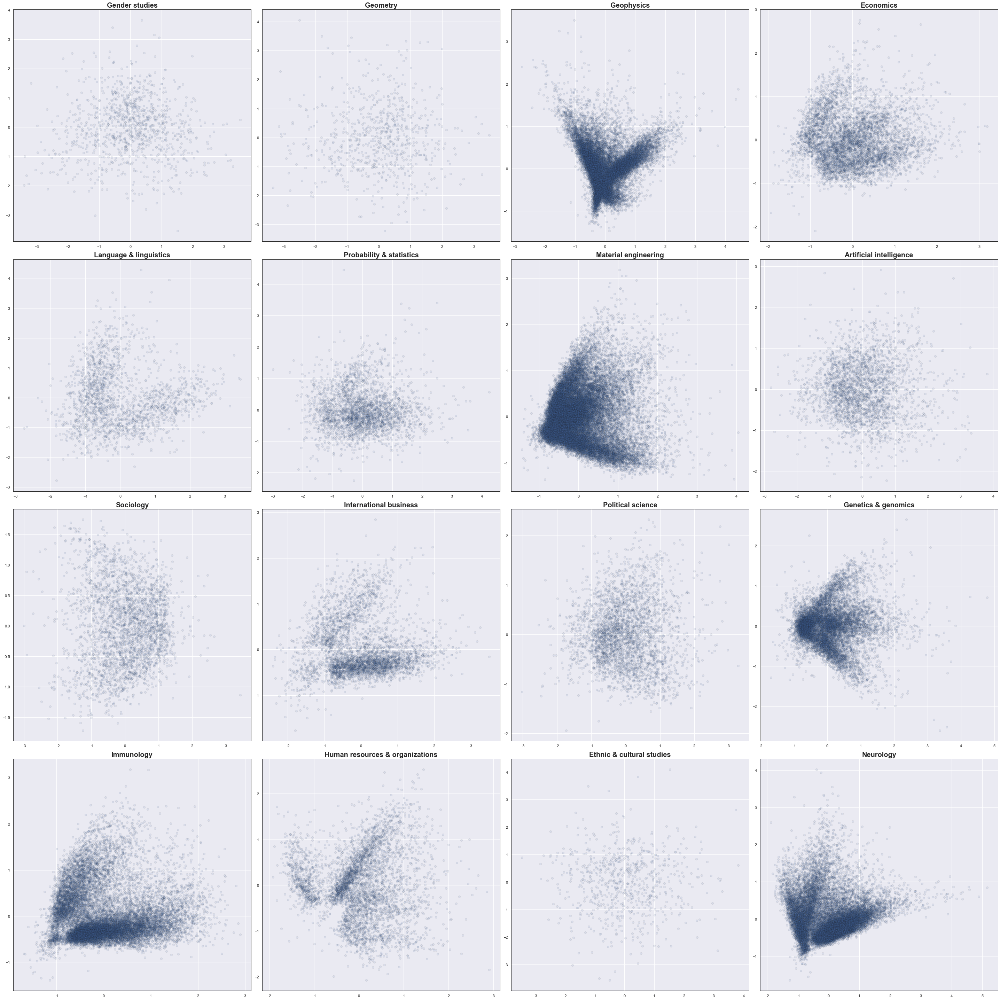

In [4]:
sns.set()
n_cols = 4
width = 10
height = 10
n_rows = np.ceil(len(Gs) / n_cols)

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*height, n_rows*width))
for (field_name, vecs), ax in zip(embs_dict.items(), axs.flatten()):

    print(field_name)
    
    embs = PCA(
        n_components=2, 
        random_state=42
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1, edgecolor='k')
    ax.set_title(f'{field_name.capitalize()}', fontweight='semibold', fontsize=20)
    
    ax.spines['top'].set_color('k')
    ax.spines['top'].set_linewidth(1)
    ax.spines['bottom'].set_color('k')
    ax.spines['bottom'].set_linewidth(1)
    ax.spines['right'].set_color('k')
    ax.spines['right'].set_linewidth(1)
    ax.spines['left'].set_color('k')
    ax.spines['left'].set_linewidth(1)

fig.tight_layout()
plt.savefig(f'{OBSIDIAN_IMG_PATH}/co_citation_pca_node2vec.png')
plt.plot()


## tSNE (Node Embeddings)

Gender Studies
Geometry
Geophysics
Economics
Language & Linguistics
Probability & Statistics
Material Engineering
Artificial Intelligence
Sociology
International Business
Political Science
Genetics & Genomics
Immunology
Human Resources & Organizations
Ethnic & Cultural Studies
Neurology


[]

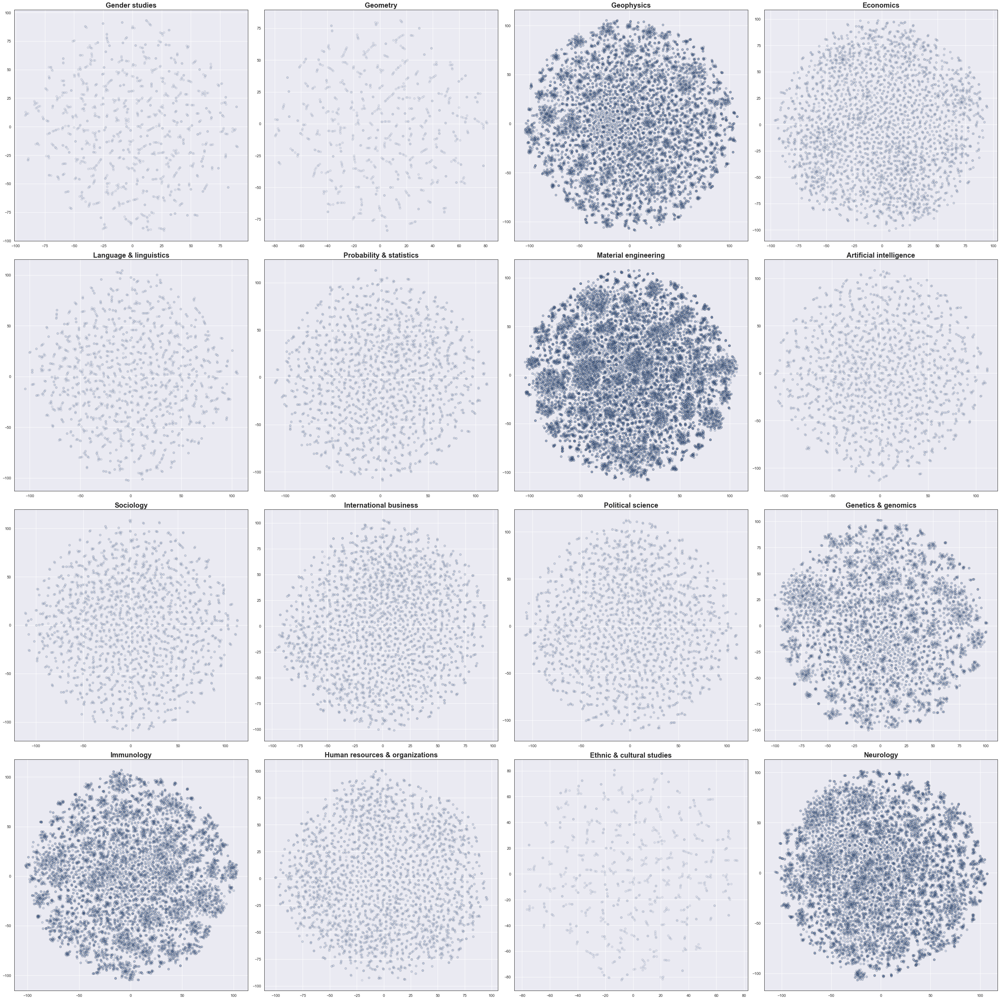

In [5]:
sns.set()
n_cols = 4
width = 10
height = 10
n_rows = np.ceil(len(Gs) / n_cols)

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*height, n_rows*width))
for (field_name, vecs), ax in zip(embs_dict.items(), axs.flatten()):

    print(field_name)

    embs = TSNE(
        n_components=2, 
        random_state=1, 
        # n_iter=1000,
        metric='cosine',
        learning_rate='auto', 
        init='random', 
        perplexity=3
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1, edgecolor='k')

    ax.set_title(f'{field_name.capitalize()}', fontweight='semibold', fontsize=20)
    
    ax.spines['top'].set_color('k')
    ax.spines['top'].set_linewidth(1)
    ax.spines['bottom'].set_color('k')
    ax.spines['bottom'].set_linewidth(1)
    ax.spines['right'].set_color('k')
    ax.spines['right'].set_linewidth(1)
    ax.spines['left'].set_color('k')
    ax.spines['left'].set_linewidth(1)

fig.tight_layout()
plt.savefig(f'{OBSIDIAN_IMG_PATH}/co_citation_tsne_node2vec.png')
plt.plot()

## UMAP (Node Embeddings)

Gender Studies
Geometry
Geophysics
Economics
Language & Linguistics
Probability & Statistics
Material Engineering
Artificial Intelligence
Sociology
International Business
Political Science
Genetics & Genomics
Immunology
Human Resources & Organizations
Ethnic & Cultural Studies
Neurology


[]

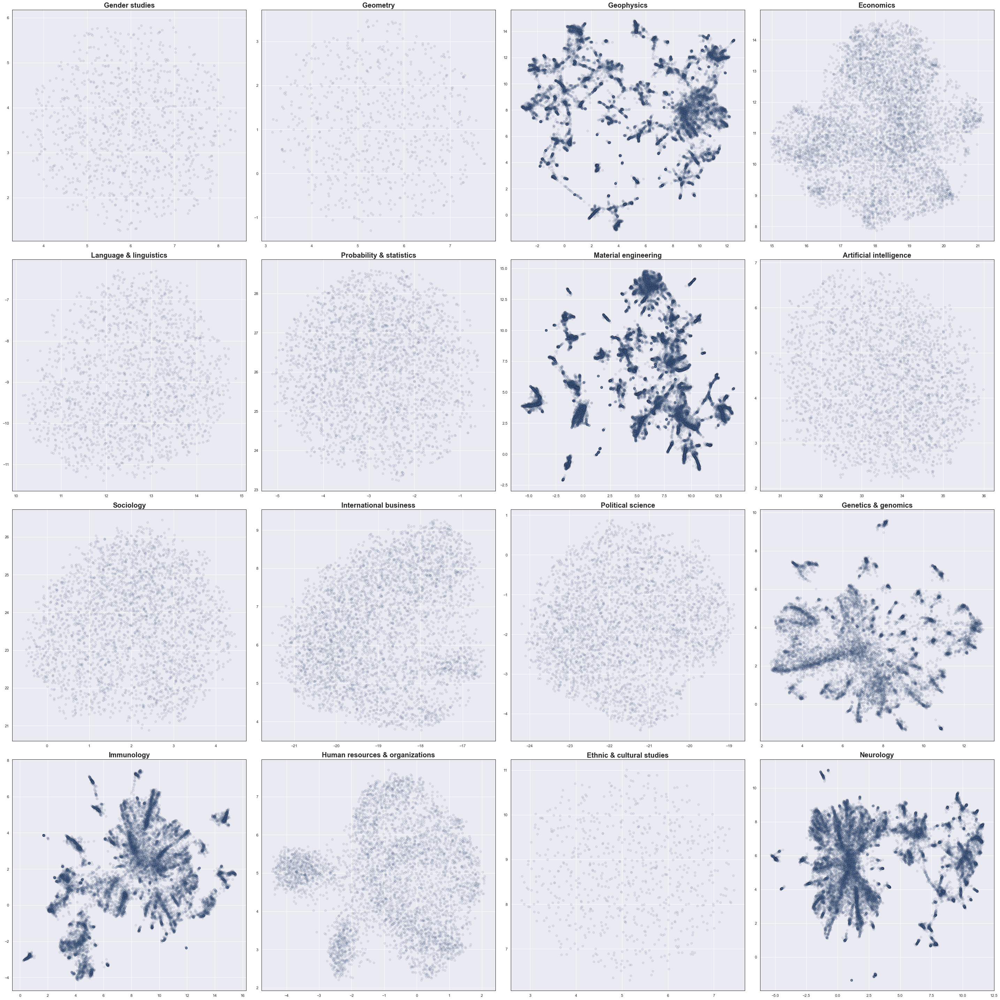

In [6]:
sns.set()
n_cols = 4
width = 10
height = 10
n_rows = np.ceil(len(Gs) / n_cols)

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*height, n_rows*width))
for (field_name, vecs), ax in zip(embs_dict.items(), axs.flatten()):

    print(field_name)
    
    reducer = umap.UMAP(random_state=42)
    embs = reducer.fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1, edgecolor='k')
    
    ax.set_title(f'{field_name.capitalize()}', fontweight='semibold', fontsize=20)
    
    ax.spines['top'].set_color('k')
    ax.spines['top'].set_linewidth(1)
    ax.spines['bottom'].set_color('k')
    ax.spines['bottom'].set_linewidth(1)
    ax.spines['right'].set_color('k')
    ax.spines['right'].set_linewidth(1)
    ax.spines['left'].set_color('k')
    ax.spines['left'].set_linewidth(1)

fig.tight_layout()
plt.savefig(f'{OBSIDIAN_IMG_PATH}/co_citation_umap_node2vec.png')
plt.plot()